# Featurization of Accelerometry Data

<br>

<br>

Le suivi des activités quotidiennes d'un individu est rendu possible grâce aux mesures d'accélérométrie alliées aux méthodes d'intelligence artificielle. Pour réaliser une analyse des activités humaines, on dispose du jeu de données publique [Dataset for ADL Recognition with Wrist-worn Accelerometer Data Set](https://archive.ics.uci.edu/ml/datasets/Dataset+for+ADL+Recognition+with+Wrist-worn+Accelerometer). 
Les données d'accélérométrie sont mesurées avec un bracelet électronique porté par plusieurs individus effectuant un total de 14 ADL. Le bracelet mesure l'accélération au niveau du poignet selon les trois axes spatiaux x, y et z avec une fréquence de 25 Hz.

L'analyse est composée de deux parties : 
- une analyse exploratoire
- une modélisation statistique des ADL

L'analyse exploratoire permet de dégager des patterns au sein des signaux d'accélérométrie, tandis que la modélisation statistique permet de prédire les ADL en fonction des signaux d'accélérométrie.
Dans ce notebook, on réalise un échantillonnage des signaux avec une fenêtre de 4 seconde sans chevauchement. Les échantillons brutes sont structurés afin d'être interprétés par un réseau de neuronne. Ils sont également featurizés pour réaliser l'analyse exploratoire à partir d'outils d'apprentissage machine non-supervisés.

In [1]:
import h5py
import pandas as pd
import numpy as np
from numpy import savetxt
import math

from scipy.fft import fft
from scipy.stats import skew
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio

In [2]:
# plot theme
pio.templates.default = "seaborn"

## Chargement des Données

In [8]:
# acceletrometry data, training set
filename = "../Accel_dataset/Accel_train.h5"

In [9]:
# input dataframe
df = pd.DataFrame()

# read hdf file
with h5py.File(filename, "r") as f:
    
    # loop over groups / samples
    count = 0
    for key in f.keys():
        sample = f.get(key)
        
        # retrieve data
        data = pd.DataFrame(sample.get('data'))
        
        # retrieve label
        label = np.array(sample.get('label'))[()]
        
        # format label
        label = str(label)[2:-1]
        
        # add label to data
        data['label'] = label
                
        # sample formatting
        sample_n = key.replace("sample_", "")
        
        # add sample number
        data['sample'] = sample_n
        
        
        # add index numbers
        #data = data.reset_index()
        
        # add sample to final output
        df = pd.concat([df, data])
        
        count = count + 1
        
        #if count > 10:
        #    break

In [10]:
def addMagnitude(df):
    '''
    add spherical coordinates to df based on its x, y, z features
    '''
    ro2 = df['x']**2 + df['y']**2
    
    df['r'] = np.sqrt(ro2 + df['z']**2)    
    #df['theta'] = np.arctan2(np.sqrt(ro2), df['z'])
    #df['phi'] = np.arctan2(df['y'], df['x'])
    
    return df

In [11]:
# time index
df = df.reset_index().rename(columns={'index' : 'time_steps'})

# rename features (0, 1, 2) to (x, y, z)
coor_mapping = {0 : 'x',
                1 : 'y',
                2 : 'z'
               }

df = df.rename(columns=coor_mapping)

# add the norm of (x, y, z) vector
df = addMagnitude(df)
df

,time_steps,x,y,z,label,sample,r
0,0,-0.880952,0.404762,0.071429,Walk_MODEL,1,0.972117
1,1,-1.002857,0.397143,0.105714,Walk_MODEL,1,1.083799
2,2,-1.231429,0.500000,0.071429,Walk_MODEL,1,1.330984
3,3,-1.317143,0.580000,0.151429,Walk_MODEL,1,1.447134
4,4,-0.905714,0.440952,0.214286,Walk_MODEL,1,1.029891
...,...,...,...,...,...,...,...
374929,1012,0.404762,0.244762,0.894286,Walk,99,1.011676
374930,1013,0.465714,0.153333,0.924762,Walk,99,1.046702
374931,1014,0.412381,0.250476,0.932381,Walk,99,1.049824
374932,1015,0.452381,0.157143,0.966667,Walk,99,1.078790


*Ajout de variables au jeu de données : les time steps par enregistrement et l'amplitude r du vecteur d'accélération (x, y, z).*

### Quelques Statistiques

Le jeu de données est composé de 979 enregistrements d'activités humaines. Ces enregistrements sont échantillonnés à une fréquence de 25 Hz : l'accélération selon les axes x, y et z est enregristrée 25 fois par seconde. Un enregistrement contient typiquement plusieurs centaines de time steps, typiquement 10 secondes, comme on peut le voir sur l'histogramme ci-dessous.

In [40]:
print('Number of records : {}'.format(df['sample'].nunique()))

Number of records : 979


In [41]:
df['label'].unique()

array(['Walk_MODEL', 'Walk', 'Liedown_bed', 'Use_telephone',
       'Sitdown_chair', 'Comb_hair', 'Standup_chair', 'Brush_teeth',
       'Eat_soup', 'Pour_water', 'Climb_stairs_MODEL', 'Climb_stairs',
       'Drink_glass', 'Pour_water_MODEL', 'Getup_bed',
       'Drink_glass_MODEL', 'Getup_bed_MODEL', 'Eat_meat',
       'Standup_chair_MODEL', 'Descend_stairs', 'Sitdown_chair_MODEL'],
      dtype=object)

On retire les classes labellisées MODEL par la suite.

In [42]:
# remove labels coming from model
mask = df['label'].str.contains('MODEL')
dfx = df[~mask]

print('Number of labels : {}'.format(dfx['label'].nunique()))

Number of labels : 14


In [61]:
fig1 = px.histogram(x = dfx['sample'].value_counts(), range_x=[0, 3000], nbins=200)
fig1.update_layout(xaxis_title_text = 'Number of time steps per record',
                  yaxis_title_text = 'Nb of records',
                  width = 500, height = 400)

*Distribution du nombre d'enregistrement en fonction de leur nombre de time steps.*


Les ADL les plus représentés sont `Climb_stairs`, `Drink_glass`, `Getup_bed`, `Pour_water`, `Sitdown_chair`, `Standup_chair` et `Walk`, commme on peut le voir sur l'histogramme ci-dessous.

In [62]:
nb_records_perADL = dfx.groupby('label')['sample'].nunique()

fig2 = px.bar(y = nb_records_perADL.values, x= nb_records_perADL.index)
fig2.update_layout(xaxis_title_text = 'ADL category',
                  yaxis_title_text = 'Nb of records',
                  width = 700, height = 350)

*Distribution du nombre d'enregistrements en fonction de l'ADL.*


## Visualisations de Signaux

###  1. Par Direction (x, y, z, r)

Les signaux d'accélération varient en fonction du temps, ou time steps. Sur la figure ci-dessous, on peut observer l'évolution des composantes x, y, z et r de l'accélération pour l'enregistrement numéro 117. Cette enregistrement est effectué au cours d'une marche (`Walk`). On peut observer une certaine périodicité de l'accélération due à la cadence propre de la marche de l'individu.

In [49]:
# selection of recording number 117
mask_1 = dfx['sample'] == "117"
dfx_1 = dfx[mask_1]

print('Recording #117 label : {}'.format(dfx_1['label'].unique()[0]))

Recording #117 label : Walk


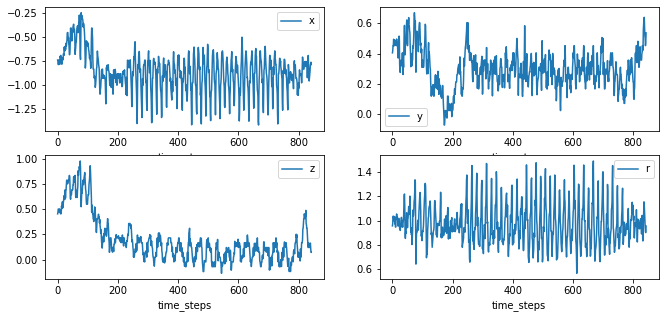

In [50]:
fig3, axs = plt.subplots(2, 2, figsize=(11, 5))
dfx_1.plot(y="x",     x="time_steps", ax=axs[0,0])
dfx_1.plot(y="y",     x="time_steps", ax=axs[0,1])
dfx_1.plot(y="z",     x="time_steps", ax=axs[1,0])
dfx_1.plot(y="r",     x="time_steps", ax=axs[1,1])

plt.show()

*Acceleration of record number 117 (Walk) along the x, y, z and r axes as function of the number of time steps. 200 time steps are equivalent to 8 seconds.*

###  2. Par ADL

Les signaux d'accélération varient significativement d'une activité à une autre. La figure ci-dessous représente un signal d'accélération selon *r* pour chaque ADL. Chaque signal provient d'un enregistrement tiré au hasard dans le jeu de données, et s'étalent sur différentes plages en temps. Cette première visualisation permet de repérer des différences de fréquences, de périodicité ou encore d'amplitudes des signaux d'accélérométrie.

In [51]:
# sampling : get 1 sample per ADL (category)
X = dfx.groupby('sample')['label'].apply(pd.Series.mode).reset_index()
X = X.drop('level_1', axis = 1)
X = X.groupby('label').apply(lambda x: x.sample(1)).reset_index(drop=True)
X

,sample,label
0,395,Brush_teeth
1,594,Climb_stairs
2,292,Comb_hair
3,935,Descend_stairs
4,725,Drink_glass
5,894,Eat_meat
6,408,Eat_soup
7,756,Getup_bed
8,134,Liedown_bed
9,498,Pour_water


*One record is randomly sampled for each ADL category.*

In [ ]:
fig4, axs = plt.subplots(14, 1, figsize=(10, 25))
i = 0
for index, row in X.iterrows():
    #print(row['sample'])
    #print(row['label'])
    # retrieve the sample number
    sid = row['sample']
    
    # select samples of sample number sid
    mask_sid = dfx['sample'] == sid
    dfx_tmp = dfx[mask_sid]
    dfx_tmp.plot(y="r", x="time_steps", label = row['label'], ax=axs[i])
    i = i+1
plt.show()

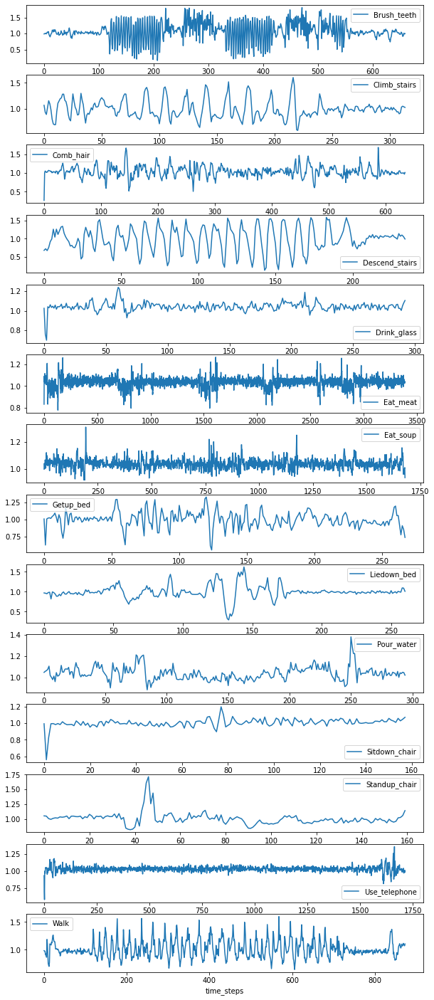

In [52]:
fig4, axs = plt.subplots(14, 1, figsize=(10, 25))
i = 0
for index, row in X.iterrows():
    #print(row['sample'])
    #print(row['label'])
    # retrieve the sample number
    sid = row['sample']
    
    # select samples of sample number sid
    mask_sid = dfx['sample'] == sid
    dfx_tmp = dfx[mask_sid]
    dfx_tmp.plot(y="r", x="time_steps", label = row['label'], ax=axs[i])
    i = i+1
plt.show()

*Acceleration of 14 records as function of the magnitude r. Each record comes from a unique ADL.*

## Calcul de Features

Les features sont calculés sur des fenêtres d'une durée 4 secondes sans chevauchement. Cette durée semble être un bon compromis car elle est suffisemment grande pour capturer la périodicité de signaux basse fréquence (comme ceux de la marche) et suffisamment petite pour capturer les sauts d'amplitudes caractéristiques de mouvements comme `Standup_chair` ou `Liedown_bed`. Des features sont calculés pour chaque fenêtre et chaque direction x, y , z et r qu'on peut regrouper en trois types : 
- **statistiques** : moyenne, médian, déviation standard, skewness, 5% et 95% pourcentiles
- **distribution en amplitude** : le bining choisi sépare la distribution en amplitude sur tout le jeu de données en 10 quantiles
- **spectre** : répartition des fréquences obtenues par transformation de Fourrier, de 0 à 12.5 Hz par pas de 0.25 Hz

In [63]:
fig5 = px.histogram(dfx, x ='r')
fig5.update_layout(yaxis_title_text = 'Number of time steps',
                  xaxis_title_text = 'r acceleration',
                  width = 500, height = 400)

*Distribution du nombre de time step (tout le jeu de données) en fonction de l'accélération selon r.*

In [19]:
dfxc = dfx.copy()

# number of time steps per window
window_size = 100

# add window index per record
window_idx = dfxc['time_steps'] / 100
dfxc['window_idx'] = window_idx.astype(int)

# add a counter for time steps per window
windo_timestep = dfxc.groupby(['sample', 'window_idx']).cumcount()
dfxc['wndw_time_steps'] = windo_timestep


# define number of quantiles per 
# for bining of histos of acc_[x, y, z and r]
n_q = 10

# discretize r variable into 10 equal-sized buckets
quantiles_r  = pd.qcut(dfxc['r'], n_q, labels = range(n_q))
quantiles_x  = pd.qcut(dfxc['x'], n_q, labels = range(n_q))
quantiles_y  = pd.qcut(dfxc['y'], n_q, labels = range(n_q))
quantiles_z  = pd.qcut(dfxc['z'], n_q, labels = range(n_q))


# add the quantiles number to the main df
dfxc['rq'] = quantiles_r
dfxc['xq'] = quantiles_x
dfxc['yq'] = quantiles_y
dfxc['zq'] = quantiles_z

*Calcul des bords de quantiles (n=10) de l'accélération selon les directions x, y , z et r, et assignation des time steps à chaque quantile*

In [21]:
dfxc

,time_steps,x,y,z,label,sample,r,window_idx,wndw_time_steps,rq,xq,yq,zq
266,0,-0.976190,0.261905,0.023810,Walk,100,1.010994,0,0,4,0,4,0
267,1,-0.976190,0.261905,0.023810,Walk,100,1.010994,0,1,4,0,4,0
268,2,-0.976190,0.288571,0.077143,Walk,100,1.020868,0,2,5,0,4,1
269,3,-0.976190,0.109524,0.119048,Walk,100,0.989503,0,3,3,0,1,1
270,4,-0.976190,0.261905,0.077143,Walk,100,1.013653,0,4,4,0,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
374929,1012,0.404762,0.244762,0.894286,Walk,99,1.011676,10,12,4,8,3,7
374930,1013,0.465714,0.153333,0.924762,Walk,99,1.046702,10,13,6,9,2,8
374931,1014,0.412381,0.250476,0.932381,Walk,99,1.049824,10,14,6,8,3,8
374932,1015,0.452381,0.157143,0.966667,Walk,99,1.078790,10,15,7,9,2,8


In [22]:
# standard statistics to compute
stats = ['mean',
         'std',
         #'max',
         #'min',
         ('median', pd.Series.median),
         ('skew', pd.Series.skew),
         ('5perc', lambda x: x.quantile(0.05)),
         ('95perc', lambda x: x.quantile(0.95))
         ]


# compute stats for acc in each direction x, y ...
df_stats = dfxc.groupby(['sample', 'window_idx']).agg({

        'x'     : stats,
        'y'     : stats,
        'z'     : stats,
        'r'     : stats,
    
        'label' : ['count', pd.Series.mode]

})

# flatten a hierarchical index in columns
df_stats.columns = ['_'.join(col).strip() for col in df_stats.columns.values]

*Calcul des statistiques (moyenne, médiane, ...) pour chaque fenêtre.*

In [23]:
df_stats

x_mean     x_std  x_median    x_skew   x_5perc  x_95perc  \
sample window_idx                                                               
100    0          -0.918381  0.178298 -0.914286 -0.262703 -1.224381 -0.642286   
       1          -0.908457  0.254150 -0.880952 -0.397736 -1.377143 -0.552667   
       2          -0.920933  0.258996 -0.925714 -0.198179 -1.374571 -0.549619   
       3          -0.890552  0.235038 -0.872381 -0.373143 -1.307810 -0.547524   
       4          -0.941429  0.233460 -0.928571 -0.378163 -1.371905 -0.604571   
...                     ...       ...       ...       ...       ...       ...   
99     6          -0.918038  0.162211 -0.898095 -0.630850 -1.216667 -0.711238   
       7          -0.931429  0.168190 -0.893333 -0.918609 -1.260095 -0.732000   
       8          -0.906610  0.138806 -0.882857 -0.398694 -1.151333 -0.698000   
       9          -0.819848  0.337810 -0.848571  2.031524 -1.225143  0.214286   
       10          0.381457  0.076953  0.404762 -1.634612  0.253524  0.455048   

                     y_mean     y_std  y_median    y_skew   y_5perc  y_95perc  \
sample window_idx                                                               
100    0           0.258495  0.065698  0.261905 -0.529509  0.166667  0.362952   
       1           0.281257  0.082700  0.297143 -0.656384  0.133524  0.395524   
       2           0.256438  0.085842  0.261905 -0.064648  0.119048  0.393524   
       3           0.295962  0.094392  0.309524  0.100156  0.162095  0.453429   
       4           0.257733  0.071595  0.261905 -0.593708  0.119048  0.357143   
...                     ...       ...       ...       ...       ...       ...   
99     6           0.295162  0.071385  0.300952 -0.676036  0.168571  0.404762   
       7           0.308629  0.066473  0.300000  0.961860  0.221619  0.441048   
       8           0.357486  0.102885  0.344762  0.860500  0.217905  0.562667   
       9           0.373067  0.127267  0.326667  1.550787  0.238667  0.666381   
       10          0.226162  0.048382  0.240952 -0.785046  0.146476  0.286667   

                     z_mean     z_std  z_median    z_skew   z_5perc  z_95perc  \
sample window_idx                                                               
100    0           0.146610  0.086280  0.150476 -0.311478  0.022667  0.280095   
       1           0.146800  0.088728  0.161905 -0.409960 -0.012571  0.261905   
       2           0.121619  0.086852  0.119048 -0.073344 -0.020095  0.248952   
       3           0.159200  0.074730  0.166667 -0.061736  0.031238  0.298476   
       4           0.156724  0.082898  0.166667 -0.365513  0.023143  0.264381   
...                     ...       ...       ...       ...       ...       ...   
99     6           0.091867  0.097767  0.096190 -0.346126 -0.073524  0.235810   
       7           0.135600  0.098513  0.143810  0.135271 -0.016381  0.291238   
       8           0.113448  0.107519  0.120952 -0.428220 -0.071714  0.261905   
       9           0.159676  0.157885  0.119048  1.984365 -0.001333  0.501143   
       10          0.949972  0.036920  0.941905  0.162510  0.891619  1.016571   

                     r_mean     r_std  r_median    r_skew   r_5perc  r_95perc  \
sample window_idx                                                               
100    0           0.972866  0.169325  0.982452  0.346016  0.724649  1.270770   
       1           0.969839  0.254006  0.935369  0.428255  0.634349  1.440266   
       2           0.971780  0.257189  0.965304  0.253551  0.606866  1.421779   
       3           0.959081  0.236185  0.956321  0.354726  0.606876  1.358811   
       4           0.995698  0.228519  0.997775  0.402150  0.674783  1.420809   
...                     ...       ...       ...       ...       ...       ...   
99     6           0.976698  0.158824  0.952091  0.809432  0.785033  1.282702   
       7           0.997598  0.168125  0.969536  0.999278  0.791234  1.326708   
       8           0.992091  0.139846  0.966942  

*Table des statistiques (colonnes) en fonction de la fenêtres (ligne).*

In [24]:
def array_to_multiCols(df, prefix):
    '''
    convert a single column containing an array
    into multiple colonnes of numbers
    '''
    df = pd.DataFrame(df.to_list(), index = df.index)
    
    df = df.add_prefix(X + prefix + '_')
    
    return df 

In [25]:
# compute acc histo and acc spetrum

directions = ['x', 'y', 'z', 'r']

dataframes_q = []
dataframes_f = []

group = dfxc.groupby(['sample', 'window_idx'])

histolam = lambda var : np.histogram(var.values, bins=range(n_q + 1))[0]
freqlam = lambda var : np.abs(fft(var.values))

# loop over directions 
# (can't find a way to groupby and apply simultaneously on x, y, z, r columns)
for X in directions:
    
    # compute histogram and spectrum for each time window
    df_X = group[X + 'q'].apply(histolam)
    df_F = group[X].apply(freqlam)
    
    # format dataframe 
    df_X = array_to_multiCols(df_X, 'q')
    df_F = array_to_multiCols(df_F, 'f')
    
    # select the first 50 frequencies
    df_F  = df_F.iloc[: , :50]
    
    # add dataframe to the list
    dataframes_q.append(df_X)
    dataframes_f.append(df_F)
    
df_Xq = pd.concat(dataframes_q, axis = 1)
df_Fq = pd.concat(dataframes_f, axis = 1)

*Calcul de la distribution en amplitude et du spectre en fréquence pour chaque fenêtre.*

In [26]:
df_Xq

xq_0  xq_1  xq_2  xq_3  xq_4  xq_5  xq_6  xq_7  xq_8  xq_9  \
sample window_idx                                                               
100    0             37    18    14    24     7     0     0     0     0     0   
       1             39     8    14    20    19     0     0     0     0     0   
       2             46     9     9    17    19     0     0     0     0     0   
       3             38     6    16    23    17     0     0     0     0     0   
       4             44    13    10    19    14     0     0     0     0     0   
...                 ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
99     6             34    17    16    31     2     0     0     0     0     0   
       7             39    12    24    24     1     0     0     0     0     0   
       8             28    21    28    21     2     0     0     0     0     0   
       9             27    13    27    22     3     1     1     0     6     0   
       10             0     0     0     0     0     0     0     1    13     3   

                   yq_0  yq_1  yq_2  yq_3  yq_4  yq_5  yq_6  yq_7  yq_8  yq_9  \
sample window_idx                                                               
100    0              0     3    11    25    47     8     6     0     0     0   
       1              0     5    10    15    34    23    12     1     0     0   
       2              0     7    13    24    39     7     9     1     0     0   
       3              0     3    14    13    28    19    17     6     0     0   
       4              0     6    11    22    42    15     4     0     0     0   
...                 ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
99     6              0     2     6    14    40    24    13     1     0     0   
       7              0     0     1    13    52    16    14     4     0     0   
       8              0     1     1     9    29    17    27    11     5     0   
       9              0     0     0     6    38    21    13    12     9     1   
       10             0     1     3     9     4     0     0     0     0     0   

                   zq_0  zq_1  zq_2  zq_3  zq_4  zq_5  zq_6  zq_7  zq_8  zq_9  \
sample window_idx                                                               
100    0              9    31    27    26     7     0     0     0     0     0   
       1             12    27    20    38     3     0     0     0     0     0   
       2             20    31    20    26     3     0     0     0     0     0   
       3              5    24    31    34     6     0     0     0     0     0   
       4             13    19    27    35     6     0     0     0     0     0   
...                 ...   ...   ...   ...   ...   ...   ...   ...   ...   ...   
99     6             26    35    21    16     2     0     0     0     0     0   
       7             19    26    26    20     9     0     0     0     0     0   
       8             23    26    24    23     4     0     0     0     0     0   
       9             12    44    22     6    10     4     1     1     0     0   
       10             0     0     0     0     0     0     0     2    13     2   

                   rq_0  rq_1  rq_2  rq_3  rq_4  rq_5  rq_6  rq_7  rq_8  rq_9  
sample window_idx                                                              
100    0             22    19     6     8    10     6     3     2    10    14  
       1             35    14     3     3     4     2     3     2    17    17  
       2             37     5     8     3     1     2     2     8    14    20  
       3             35    12     5     4     5     5     2     3    10    19  
       4             32     9     5     4     5     3     1     7    15    19  
...                 ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  
99     6             28    13    12     7     9     3     4     3     7    14  
       7             20    19    11     6     2     2    14     5     6    15  
       8             12    24    15     8     5     1    

*Table de la distribution en amplitude de l'accélération des fenêtres (1 colonne = 1 quantile, 1 ligne = 1 fenêtre).*

In [27]:
df_Fq

xf_0      xf_1      xf_2      xf_3      xf_4  \
sample window_idx                                                      
100    0           91.838095  0.937579  0.747091  2.913352  0.298087   
       1           90.845714  0.238057  0.527438  2.657325  3.434992   
       2           92.093333  0.191805  0.812071  0.916360  2.347319   
       3           89.055238  1.397012  1.145265  3.430609  2.321875   
       4           94.142857  1.912435  1.993729  4.812196  1.298142   
...                      ...       ...       ...       ...       ...   
99     6           91.803810  0.624357  0.738276  1.499027  2.086807   
       7           93.142857  0.635357  0.636660  1.887384  2.796486   
       8           90.660952  1.765229  1.573593  2.386756  0.671727   
       9           81.984762  9.697445  9.882719  8.671092  9.752500   
       10           6.484762  0.518461  0.442746  0.333457  0.124664   

                       xf_5      xf_6       xf_7      xf_8      xf_9  \
sample window_idx                                                      
100    0           0.374999  9.466881   5.723465  2.313475  0.507711   
       1           3.305897  9.685178  10.927134  3.905750  1.008438   
       2           4.332248  9.012795  10.967419  3.654030  2.920744   
       3           4.511938  6.653150  11.197064  1.522808  4.435093   
       4           2.712507  9.432341   8.794734  3.913676  2.029452   
...                     ...       ...        ...       ...       ...   
99     6           1.935610  3.922053   7.586079  0.361993  0.931251   
       7           1.010480  4.386450   7.225945  1.241071  1.002622   
       8           1.861915  2.852898   3.737410  2.549846  1.564826   
       9           8.258571  3.418659   5.214631  4.219619  2.764897   
       10          0.219716  0.239608   0.297751  0.139494  0.139494   

                      xf_10     xf_11     xf_12     xf_13     xf_14     xf_15  \
sample window_idx                                                               
100    0           1.840319  1.257833  0.739705  0.884636  0.235943  0.378728   
       1           1.961259  1.853738  1.139411  2.593951  1.358846  0.810161   
       2           5.089816  1.843839  2.353830  3.157077  0.780423  1.593186   
       3           1.029807  0.932123  2.655419  2.089824  0.262521  0.975810   
       4           1.485697  1.246583  1.028027  3.791298  0.577349  0.838032   
...                     ...       ...       ...       ...       ...       ...   
99     6           1.730326  1.847908  1.393202  2.771354  1.454092  0.707939   
       7           2.072218  1.380389  0.660620  1.624978  3.133587  0.930658   
       8           2.266887  1.738694  2.134269  2.647718  1.122466  1.106301   
       9           1.234207  0.911290  3.812697  2.012869  2.566389  1.125298   
       10          0.297751  0.239608  0.219716  0.124664  0.333457  0.442746   

                      xf_16     xf_17     xf_18     xf_19     xf_20     xf_21  \
sample window_idx                                                               
100    0           1.239534  0.851195  0.241842  0.940376  0.685527  1.058434   
       1           0.883993  1.208184  0.629453  0.563131  3.200074  1.127754   
       2           0.820981  1.720215  1.089226  1.270004  2.095422  0.297195   
       3           0.568462  0.937158  1.033422  1.275666  1.674167  2.022986   
       4           0.616775  0.902554  0.669806  1.867758  0.973036  0.918023   
...                     ...       ...       ...       ...       ...       ...   
99     6           0.746394  0.864973  0.797645  0.974570  3.716207  0.217697   
       7           0.564543  0.304425  0.686873  0.641185  3.082614  2.147628   
       8           1.502618  1.486071  1.879876  0.737430  2.203785  0.416022   
       9           0.280043  2.347487  3.316247  1.651773  1.207825  0.267855   
       10          0.518461       NaN       NaN       NaN       NaN       NaN   

                      xf_22     xf_23     

*Table du spectre en fréquence des fenêtres (1 colonne = 1 fréquence, 1 ligne = 1 fenêtre).*

In [28]:
# merge 3 dfs : statistics, histograms & spectrums
df_feat = pd.concat([df_stats, df_Xq, df_Fq], axis = 1)

# remove window with less that 100 time steps
mask_100st = df_feat['label_count'] == 100
df_feat = df_feat[mask_100st]

df_feat = df_feat.drop('label_count', axis = 1)

In [29]:
# save features into csv file
df_feat.to_csv('mydata/clust/data_featurized.csv')

*Les données featurizées sont enregistrées dans une fichier csv.*

## Features for Neural Network

In [30]:
# loop over directions x, y ...
for X in directions:
    
    # df : 1 row = 1 window
    #      1 column = 1 time step
    df_nn_w = dfxc.pivot_table(index=['sample', 'window_idx'],
                               columns='wndw_time_steps',
                               values=X)
    
    # remove incomplete time windows
    df_nn_w = df_nn_w.loc[df_feat.index]
    
    # numpy conversion
    df_nn_w = df_nn_w.values
    
    # save data into csv file
    savetxt('mydata/NN/data_feature_nn_' + X + '.csv', df_nn_w, delimiter=',')

*Les signaux brutes séparés en fenêtre de 4 secondes sont enregistrés dans un fichier csv.*

In [31]:
# get labels 
labels = df_feat['label_mode']

# save into csv file
labels.to_csv('mydata/NN/y_nn.csv', index=False, header = False)

*Finalement, les labels (ADL) sont enregistrés dans un fichier csv.*

## Conclusion

Chaque signal d'accélérométrie est enregistré pendant une activité spécifique sur une durée d'environ 10 secondes. Le jeu de données contient presque 1000 enregistrements et un total de 14 ADL. La magnitude du signal d'accélération est calculée à partir des composantes de base x, y, z et est ajoutée au jeu de données. La visualtion des signaux d'accération permet de remarquer quelques caractéristiques propres à certaines ADL.

Les signaux brutes sont regroupés en fenêtre de 4 secondes sans chevauchement. Des features sont calculés à partir des ces fenêtres (spectre, distribution d'amplitude et statistiques) et enregistrés dans un jeu de données qui sera utilisé dans une analyse de recherche de patterns. Les signaux brutes séparés en fenêtre sont également enregistré dans un jeu de donnée pour une classification avec un réseau de neurones.